# Project Overview

The goal of the project is to build a deep-learning model that is able to detect potholes.

## The Dataset

The pothole dataset contains 665 images annotated with bounding boxes around potholes.The annotations are in XML format(similar to Pascal VOC). There is a splits.json file in which training-test sets are defined.

# 1. Task 1

- Understand the data structure
- Visualize the images

Visualizing img-1.jpg with 1 bounding boxes.
Visualizing img-10.jpg with 1 bounding boxes.
Visualizing img-100.jpg with 1 bounding boxes.
Visualizing img-101.jpg with 2 bounding boxes.
Visualizing img-102.jpg with 1 bounding boxes.
Visualizing img-103.jpg with 1 bounding boxes.


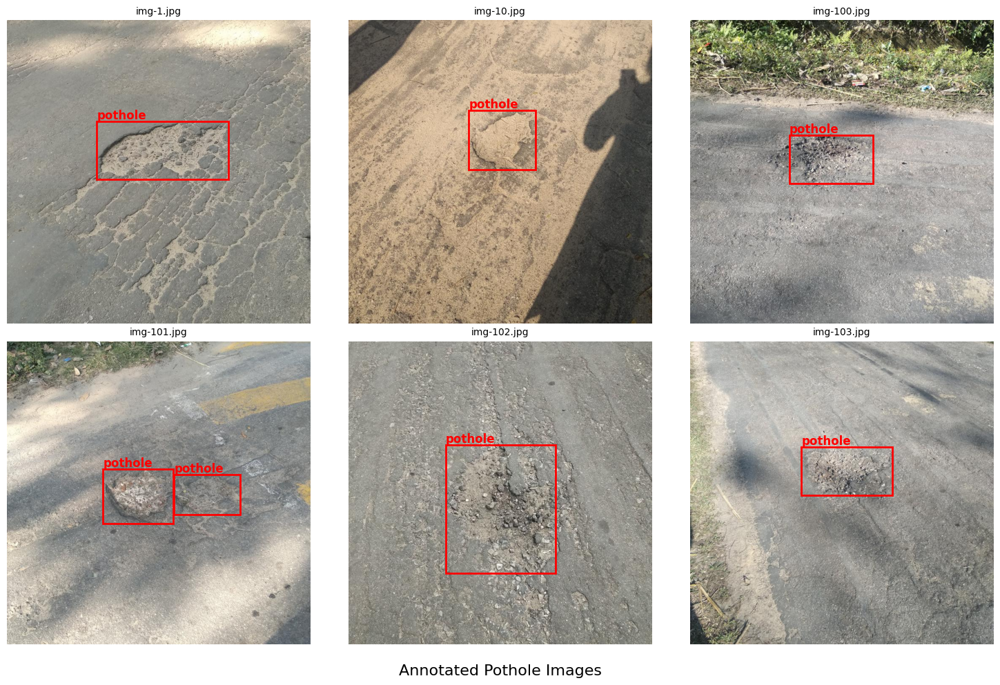

In [1]:
import os
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def parse_annotation(xml_file):
    """
    Parses a Pascal VOC XML file and extracts bounding box coordinates.

    Args:
        xml_file (str): Path to the XML annotation file.

    Returns:
        list: A list of dictionaries containing bounding box coordinates.
    """
    tree = ET.parse(xml_file)
    root = tree.getroot()
    boxes = []

    for obj in root.iter('object'):
        bbox = obj.find('bndbox')
        box = {
            'xmin': int(bbox.find('xmin').text),
            'ymin': int(bbox.find('ymin').text),
            'xmax': int(bbox.find('xmax').text),
            'ymax': int(bbox.find('ymax').text),
            'class': obj.find('name').text
        }
        boxes.append(box)

    return boxes

def visualize_image(image_path, boxes, ax):
    """
    Displays the image with bounding boxes overlaid on the given Axes.

    Args:
        image_path (str): Path to the image file.
        boxes (list): A list of bounding box dictionaries.
        ax (matplotlib.axes.Axes): The Axes object to plot on.
    """
    # Open the image
    image = Image.open(image_path)
    ax.imshow(image)

    # Add bounding boxes
    for box in boxes:
        xmin, ymin, xmax, ymax = box['xmin'], box['ymin'], box['xmax'], box['ymax']
        width = xmax - xmin
        height = ymax - ymin
        rect = patches.Rectangle(
            (xmin, ymin), width, height,
            linewidth=2, edgecolor='r', facecolor='none'
        )
        ax.add_patch(rect)
        ax.text(
            xmin, ymin - 5, box['class'],
            fontsize=12, color='red', weight='bold'
        )

    ax.axis('off')  # Hide the axes ticks

def visualize_dataset(images_dir, annotations_dir, num_images=6, rows=2, cols=3):
    """
    Visualizes a specified number of images with bounding boxes from the dataset
    in a single figure with subplots.

    Args:
        images_dir (str): Directory containing the images.
        annotations_dir (str): Directory containing the XML annotation files.
        num_images (int): Number of images to visualize.
        rows (int): Number of rows in the subplot grid.
        cols (int): Number of columns in the subplot grid.
    """
    image_files = os.listdir(images_dir)
    image_files = [f for f in image_files if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    image_files.sort()

    # Adjust num_images if there are fewer images available
    num_images = min(num_images, len(image_files))

    # Create subplots
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
    fig.text(0.5, 0.02, "Annotated Pothole Images", ha='center', fontsize=16)

    axes = axes.flatten()  # Flatten to easily iterate

    for i in range(num_images):
        image_file = image_files[i]
        image_path = os.path.join(images_dir, image_file)
        annotation_file = os.path.join(
            annotations_dir, os.path.splitext(image_file)[0] + '.xml'
        )

        if not os.path.exists(annotation_file):
            print(f"Annotation file for {image_file} not found.")
            axes[i].axis('off')  # Hide the subplot if annotation is missing
            continue

        boxes = parse_annotation(annotation_file)
        print(f"Visualizing {image_file} with {len(boxes)} bounding boxes.")
        visualize_image(image_path, boxes, axes[i])
        axes[i].set_title(f"{image_file}", fontsize=10)

    # Hide any remaining subplots if num_images < rows*cols
    for j in range(num_images, rows * cols):
        axes[j].axis('off')

    plt.tight_layout(rect=[0, 0.05, 1, 1])
    plt.show()

if __name__ == "__main__":
        # Specify the paths to your dataset directories
    images_directory = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/annotated-images'         # e.g., './Potholes/images'
    annotations_directory = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/annotated-images'  # e.g., './Potholes/annotations'

    # Visualize the images
    visualize_dataset(images_directory, annotations_directory, num_images=6, rows=2, cols=3)


Total number of images: 665

Number of unique image sizes: 117

Number of unique image aspect ratios: 116

Total number of pothole annotations: 1740

Maximum number of objects in an image: 19
Minimum number of objects in an image: 1

Image(s) with the maximum number of potholes (19):
- img-595.jpg


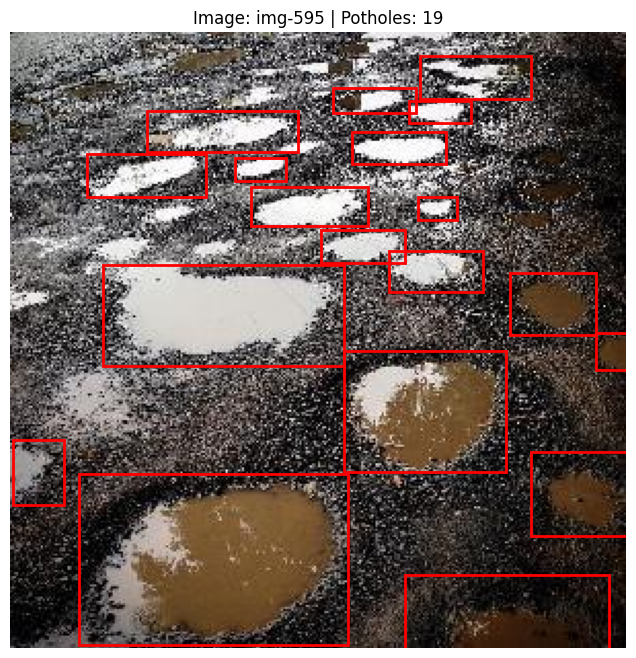

In [2]:
import os
import xml.etree.ElementTree as ET
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def get_unique_image_sizes_and_ratios(images_dir):
    """
    Retrieves the unique sizes of images and their aspect ratios in the directory.

    Args:
        images_dir (str): Path to the directory containing images.

    Returns:
        dict: A dictionary with sizes as keys and counts as values.
        set: A set of unique aspect ratios.
    """
    size_counts = {}
    aspect_ratios = set()
    for image_file in os.listdir(images_dir):
        if image_file.lower().endswith(('.jpg', '.jpeg', '.png')):
            image_path = os.path.join(images_dir, image_file)
            try:
                with Image.open(image_path) as img:
                    width, height = img.size
                    size = (width, height)
                    # Calculate aspect ratio
                    if height != 0:
                        ratio = width / height
                        aspect_ratios.add(round(ratio, 4))  # Rounded for readability
                    else:
                        print(f"Warning: Image {image_file} has zero height.")
                        ratio = None
                    # Count sizes
                    if size in size_counts:
                        size_counts[size] += 1
                    else:
                        size_counts[size] = 1
            except Exception as e:
                print(f"Error processing image {image_file}: {e}")
    return size_counts, aspect_ratios

def count_annotations(annotations_dir):
    """
    Counts the total number of pothole annotations in the dataset and tracks
    the number of objects per image.

    Args:
        annotations_dir (str): Path to the directory containing XML annotation files.

    Returns:
        int: Total number of pothole annotations.
        dict: Dictionary mapping image filenames to their number of pothole annotations.
    """
    total_annotations = 0
    objects_per_image = {}  # Dictionary to store number of objects per image

    for annotation_file in os.listdir(annotations_dir):
        if annotation_file.lower().endswith('.xml'):
            xml_path = os.path.join(annotations_dir, annotation_file)
            try:
                tree = ET.parse(xml_path)
                root = tree.getroot()
                num_objects = len(root.findall('object'))
                total_annotations += num_objects
                # Extract image filename from annotation filename
                image_filename = os.path.splitext(annotation_file)[0]
                objects_per_image[image_filename] = num_objects
            except ET.ParseError as pe:
                print(f"Parse error in file {annotation_file}: {pe}")
            except Exception as e:
                print(f"Error processing annotation {annotation_file}: {e}")

    return total_annotations, objects_per_image

def find_images_with_max_objects(objects_per_image):
    """
    Identifies image(s) with the maximum number of objects.

    Args:
        objects_per_image (dict): Dictionary mapping image filenames to their number of pothole annotations.

    Returns:
        int: Maximum number of objects found in any image.
        list: List of image filenames that have the maximum number of objects.
    """
    if not objects_per_image:
        return 0, []

    max_objects = max(objects_per_image.values())
    images_with_max = [filename for filename, count in objects_per_image.items() if count == max_objects]

    return max_objects, images_with_max

def visualize_image_with_annotations(images_dir, annotations_dir, image_filename):
    """
    Visualizes an image with its bounding box annotations.

    Args:
        images_dir (str): Path to the directory containing images.
        annotations_dir (str): Path to the directory containing XML annotation files.
        image_filename (str): Filename of the image to visualize (without extension).
    """
    image_path_jpg = os.path.join(images_dir, image_filename + '.jpg')
    image_path_png = os.path.join(images_dir, image_filename + '.png')
    image_path_jpeg = os.path.join(images_dir, image_filename + '.jpeg')

    # Determine the correct image extension
    if os.path.exists(image_path_jpg):
        image_path = image_path_jpg
    elif os.path.exists(image_path_png):
        image_path = image_path_png
    elif os.path.exists(image_path_jpeg):
        image_path = image_path_jpeg
    else:
        print(f"Image file for {image_filename} not found in {images_dir}.")
        return

    # Load the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to load image at {image_path}.")
        return

    # Convert BGR to RGB for plotting
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Parse annotations to get bounding boxes
    annotation_file = os.path.join(annotations_dir, image_filename + '.xml')
    try:
        tree = ET.parse(annotation_file)
        root = tree.getroot()
        boxes = []
        for obj in root.findall('object'):
            bbox = obj.find('bndbox')
            xmin = int(bbox.find('xmin').text)
            ymin = int(bbox.find('ymin').text)
            xmax = int(bbox.find('xmax').text)
            ymax = int(bbox.find('ymax').text)
            boxes.append((xmin, ymin, xmax, ymax))
    except Exception as e:
        print(f"Error parsing annotations for {image_filename}: {e}")
        return

    # Plot the image
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(image_rgb)
    ax.set_title(f"Image: {image_filename} | Potholes: {len(boxes)}")
    ax.axis('off')

    # Add bounding boxes
    for box in boxes:
        xmin, ymin, xmax, ymax = box
        width = xmax - xmin
        height = ymax - ymin
        rect = patches.Rectangle((xmin, ymin), width, height, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

    plt.show()

def main():
    images_directory = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/annotated-images'         # Path to images
    annotations_directory = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/annotated-images'          # Path to annotations

    # Verify directories exist
    if not os.path.exists(images_directory):
        print(f"Images directory '{images_directory}' does not exist.")
        return
    if not os.path.exists(annotations_directory):
        print(f"Annotations directory '{annotations_directory}' does not exist.")
        return

    # Count total images
    image_files = [f for f in os.listdir(images_directory)
                   if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    total_images = len(image_files)
    print(f"Total number of images: {total_images}")

    # Get unique image sizes and aspect ratios
    unique_sizes, aspect_ratios = get_unique_image_sizes_and_ratios(images_directory)
    num_unique_sizes = len(unique_sizes)
    num_unique_ratios = len(aspect_ratios)

    print(f"\nNumber of unique image sizes: {num_unique_sizes}")
   

    print(f"\nNumber of unique image aspect ratios: {num_unique_ratios}")



    # Count total annotations and track objects per image
    total_annotations, objects_per_image = count_annotations(annotations_directory)
    print(f"\nTotal number of pothole annotations: {total_annotations}")

    if objects_per_image:
        max_objects, images_with_max = find_images_with_max_objects(objects_per_image)
        min_objects = min(objects_per_image.values())
        print(f"\nMaximum number of objects in an image: {max_objects}")
        print(f"Minimum number of objects in an image: {min_objects}")

        print(f"\nImage(s) with the maximum number of potholes ({max_objects}):")
        for image_name in images_with_max:
            print(f"- {image_name}.jpg")
            # Optionally, visualize the image with annotations
            visualize_image_with_annotations(images_directory, annotations_directory, image_name)
    else:
        print("\nNo annotations found to determine maximum and minimum number of objects per image.")

if __name__ == "__main__":
    main()


# 2. Task2: Extract Object proposals for all the images

The goal is to generate candidate regions in each image that may contain potholes using object proposal algorithms.

**What are object proposals?**
Regions in an image that are likely to contain objects of interest. They allow to reduce the search space for the object detection models by focusing on promising areas.

Some moethods:

**Selective Search(SS):**
- It groups pixels based on color, texture, size and shape compatibility. Hierarchical grouping leads to region proposals.

**Edge Boxes:**
- Score boxes based on the number of enclosed eedges. It is faster than SS and generates high-quality proposals

How to extract the proposals?

1. Resize the images to spped up the process(specially with SS it is neccessary)
2. Implementation of the algorithm
3. Iterate over the dataset and aply the algo
4. Save the proposals as numpy arrays

In [3]:

import os
import cv2
import time
import numpy as np

def resize_image(image, max_dim=300):
    """
    Resizes the image so its largest dimension equals max_dim while preserving aspect ratio.

    Args:
        image (numpy.ndarray): Original image.
        max_dim (int): Maximum dimension size.

    Returns:
        numpy.ndarray: Resized image.
        float: Resize ratio.
    """
    h, w = image.shape[:2]
    if max(h, w) > max_dim:
        ratio = max_dim / max(h, w)
        resized_image = cv2.resize(image, (int(w * ratio), int(h * ratio)))
    else:
        resized_image = image.copy()
        ratio = 1.0
    return resized_image, ratio


In [4]:

def extract_selective_search(image):
    """
    Extracts object proposals using Selective Search.

    Args:
        image (numpy.ndarray): Image to process.

    Returns:
        list: List of bounding boxes (x, y, w, h).
    """
    ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
    ss.setBaseImage(image)
    ss.switchToSelectiveSearchFast()
    rects = ss.process()
    return rects

def process_images(images_dir, output_dir):
    """
    Processes all images in the directory to extract proposals.

    Args:
        images_dir (str): Path to images directory.
        output_dir (str): Path to output directory.
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    image_files = [f for f in os.listdir(images_dir)
                   if f.endswith(('.jpg', '.jpeg', '.png'))]
    total_images = len(image_files)
    print(f"Total images: {total_images}")

    for idx, image_file in enumerate(image_files):
        image_path = os.path.join(images_dir, image_file)
        image = cv2.imread(image_path)
        if image is None:
            print(f"Could not read {image_file}, skipping.")
            continue

        # Resize image
        resized_image, ratio = resize_image(image)

        # Extract proposals
        start_time = time.time()
        rects = extract_selective_search(resized_image)
        end_time = time.time()

        print(f"[{idx+1}/{total_images}] {image_file}: {len(rects)} proposals extracted in {end_time - start_time:.2f}s.")

        # Adjust proposals back to original size
        if ratio != 1.0:
            adjusted_rects = []
            for (x, y, w, h) in rects:
                x = int(x / ratio)
                y = int(y / ratio)
                w = int(w / ratio)
                h = int(h / ratio)
                adjusted_rects.append((x, y, w, h))
            rects = adjusted_rects

        # Save proposals
        proposals_file = os.path.join(output_dir, os.path.splitext(image_file)[0] + '_proposals.npy')
        np.save(proposals_file, rects)

def main():
    images_directory = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/annotated-images'       # e.g., './Potholes/JPEGImages'
    output_directory = 'ss_proposals'       # e.g., './Potholes/Proposals'

    process_images(images_directory, output_directory)

if __name__ == "__main__":
    main()


Total images: 665
[1/665] img-627.jpg: 463 proposals extracted in 0.47s.


[2/665] img-570.jpg: 242 proposals extracted in 0.28s.
[3/665] img-598.jpg: 123 proposals extracted in 0.27s.
[4/665] img-6.jpg: 169 proposals extracted in 0.48s.
[5/665] img-586.jpg: 263 proposals extracted in 0.37s.
[6/665] img-157.jpg: 235 proposals extracted in 0.50s.
[7/665] img-405.jpg: 531 proposals extracted in 0.40s.
[8/665] img-468.jpg: 738 proposals extracted in 0.41s.
[9/665] img-532.jpg: 568 proposals extracted in 0.30s.
[10/665] img-311.jpg: 425 proposals extracted in 0.35s.
[11/665] img-460.jpg: 447 proposals extracted in 0.36s.
[12/665] img-584.jpg: 512 proposals extracted in 0.34s.
[13/665] img-7.jpg: 270 proposals extracted in 0.50s.
[14/665] img-274.jpg: 128 proposals extracted in 0.46s.
[15/665] img-283.jpg: 187 proposals extracted in 0.49s.
[16/665] img-113.jpg: 200 proposals extracted in 0.49s.
[17/665] img-389.jpg: 753 proposals extracted in 0.35s.
[18/665] img-352.jpg: 413 proposals extracted in 0.38s.
[19/665] img-137.jpg: 175 proposals extracted in 0.47s.
[20/

Loaded 186 proposals from /home/arth/Desktop/various/CV/poster3/Potholes/Potholes/ss_proposals/img-1_proposals.npy.


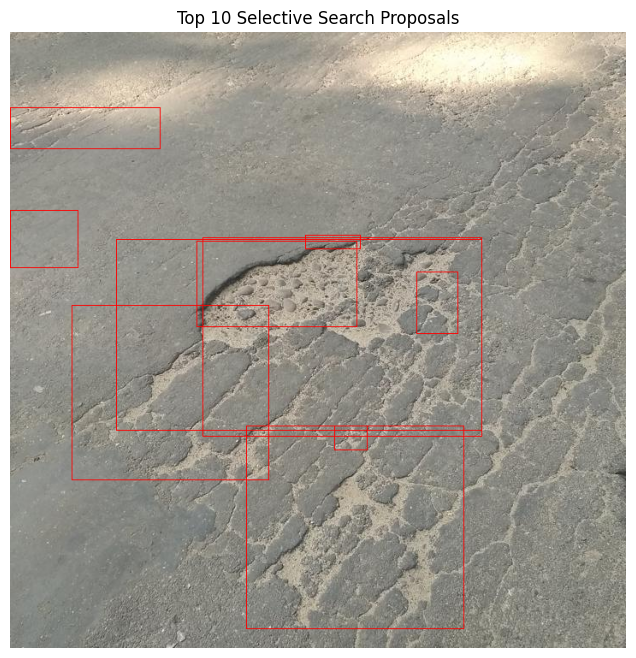

Visualized image saved at SS_example_image_top_proposals.jpg.


In [5]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
def draw_bounding_boxes(image, boxes, color=(0, 255, 0), thickness=2):
    """
    Draws bounding boxes on the image.

    Args:
        image (numpy.ndarray): Image on which to draw.
        boxes (list): List of bounding boxes (x, y, w, h).
        color (tuple): Bounding box color in BGR.
        thickness (int): Thickness of the bounding box lines.

    Returns:
        numpy.ndarray: Image with bounding boxes drawn.
    """
    for (x, y, w, h) in boxes:
        cv2.rectangle(image, (x, y), (x + w, y + h), color, thickness)
    return image

def visualize_top_proposals(image_path, proposals, top_n=100, save_path=None, alg='ss'):
    """
    Visualizes the top N proposals on the image.

    Args:
        image_path (str): Path to the image file.
        proposals (list): List of bounding boxes (x, y, w, h).
        top_n (int): Number of top proposals to visualize.
        save_path (str, optional): Path to save the visualized image. If None, the image is not saved.
    """
    # Load the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to load image at {image_path}.")
        return

    # Convert BGR to RGB for displaying with matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Select top N proposals
    top_proposals = proposals[:top_n]

    # Draw bounding boxes on a copy of the image
    image_with_boxes = image_rgb.copy()
    image_with_boxes = draw_bounding_boxes(image_with_boxes, top_proposals, color=(255, 0, 0), thickness=1)

    # Display the image
    plt.figure(figsize=(12, 8))
    plt.imshow(image_with_boxes)
    if alg=='ss':
        plt.title(f"Top {top_n} Selective Search Proposals")
    elif alg=="eb":
        plt.title(f"Top {top_n} EdgeBoxes Proposals")
        
    plt.axis('off')
    plt.show()

    # Save the visualized image if a save path is provided
    if save_path:
        # Convert back to BGR before saving with cv2
        image_bgr = cv2.cvtColor(image_with_boxes, cv2.COLOR_RGB2BGR)
        cv2.imwrite(save_path, image_bgr)
        print(f"Visualized image saved at {save_path}.")

images_directory = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/annotated-images'  # Path to images
example_image_filename = 'img-1.jpg'  # Replace with your example image filename
example_image_path = os.path.join(images_directory, example_image_filename)
proposals_directory = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/ss_proposals'  # Directory where Selective Search proposals are saved
proposals_file = os.path.join(proposals_directory, os.path.splitext(example_image_filename)[0] + '_proposals.npy')
output_visualization_path = 'SS_example_image_top_proposals.jpg'  # Path to save the visualization (optional)
top_n = 10  # Number of top proposals to visualize

# Check if the proposals file exists
if not os.path.exists(proposals_file):
    print(f"Proposals file {proposals_file} not found. Extracting proposals now...")

    # Ensure the proposals directory exists
    if not os.path.exists(proposals_directory):
        os.makedirs(proposals_directory)

    # Load the image
    image = cv2.imread(example_image_path)
    if image is None:
        print(f"Error: Unable to load image at {example_image_path}.")
        

    # Resize the image
    resized_image, ratio = resize_image(image, max_dim=300)

    # Extract proposals
    start_time = time.time()
    rects = extract_selective_search(resized_image)
    end_time = time.time()
    print(f"Proposals extracted: {len(rects)} in {end_time - start_time:.2f}s.")

    # Adjust proposals back to original size
    if ratio != 1.0:
        adjusted_rects = []
        for (x, y, w, h) in rects:
            x = int(x / ratio)
            y = int(y / ratio)
            w = int(w / ratio)
            h = int(h / ratio)
            adjusted_rects.append((x, y, w, h))
        rects = adjusted_rects

    # Save proposals
    np.save(proposals_file, rects)
    print(f"Proposals saved at {proposals_file}.")

# Load the proposals
proposals = np.load(proposals_file, allow_pickle=True)
print(f"Loaded {len(proposals)} proposals from {proposals_file}.")

# Visualize the top N proposals
visualize_top_proposals(
    image_path=example_image_path,
    proposals=proposals,
    top_n=top_n,
    save_path=output_visualization_path  # Set to None if you don't want to save the image
)

In [6]:
#!wget https://raw.githubusercontent.com/opencv/opencv_extra/master/testdata/cv/ximgproc/model.yml.gz -P /home/arth/Desktop/various/CV/poster3/Potholes/Potholes

In [7]:
import os
import cv2
import numpy as np
import time

def extract_edge_boxes(image):
    """
    Extracts object proposals using Edge Boxes.

    Args:
        image (numpy.ndarray): Image to process.

    Returns:
        list: List of bounding boxes [x, y, w, h].
    """
    # Initialize EdgeBoxes object
    edge_boxes = cv2.ximgproc.createEdgeBoxes()
    edge_boxes.setMaxBoxes(2000)  # You can adjust the maximum number of boxes

    # Convert image to grayscale if needed
    if len(image.shape) == 3:
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray_image = image

    # Compute edges and orientation using Structured Forests method
    edge_detector = cv2.ximgproc.createStructuredEdgeDetection("model.yml.gz")
    rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    edges = edge_detector.detectEdges(np.float32(rgb_image) / 255.0)
    orientation = edge_detector.computeOrientation(edges)
    edges_nms = edge_detector.edgesNms(edges, orientation)

    # Extract Edge Boxes
    boxes, scores = edge_boxes.getBoundingBoxes(edges_nms, orientation)

    # Convert to list of bounding boxes [x, y, w, h]
    rects = [tuple(box) for box in boxes]

    return rects

def process_images_edge_boxes(images_dir, output_dir):
    """
    Processes all images in the directory to extract Edge Boxes proposals.

    Args:
        images_dir (str): Path to images directory.
        output_dir (str): Path to output directory.
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    image_files = [f for f in os.listdir(images_dir)
                   if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    total_images = len(image_files)
    print(f"Total images: {total_images}")

    for idx, image_file in enumerate(image_files):
        proposal_filename = os.path.splitext(image_file)[0] + '_edgeboxes.npy'
        proposal_path = os.path.join(output_dir, proposal_filename)

        if os.path.exists(proposal_path):
            print(f"[{idx+1}/{total_images}] {image_file}: Edge Boxes proposals already exist. Skipping.")
            continue

        image_path = os.path.join(images_dir, image_file)
        image = cv2.imread(image_path)
        if image is None:
            print(f"[{idx+1}/{total_images}] {image_file}: Could not read image. Skipping.")
            continue

        # Resize image
        resized_image, ratio = resize_image(image)

        # Extract Edge Boxes
        start_time = time.time()
        rects = extract_edge_boxes(resized_image)
        end_time = time.time()

        print(f"[{idx+1}/{total_images}] {image_file}: {len(rects)} Edge Boxes proposals extracted in {end_time - start_time:.2f}s.")

        # Adjust proposals back to original size
        if ratio != 1.0:
            adjusted_rects = []
            for (x, y, w, h) in rects:
                x = int(x / ratio)
                y = int(y / ratio)
                w = int(w / ratio)
                h = int(h / ratio)
                adjusted_rects.append((x, y, w, h))
            rects = adjusted_rects

        # Save proposals
        np.save(proposal_path, rects)

def main():
    images_directory = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/annotated-images'         # Replace with your images directory
    output_directory = 'edgeboxes_output'  # Replace with your output directory for Edge Boxes proposals

    process_images_edge_boxes(images_directory, output_directory)

if __name__ == "__main__":
    main()


Total images: 665
[1/665] img-627.jpg: Edge Boxes proposals already exist. Skipping.
[2/665] img-570.jpg: Edge Boxes proposals already exist. Skipping.
[3/665] img-598.jpg: Edge Boxes proposals already exist. Skipping.
[4/665] img-6.jpg: Edge Boxes proposals already exist. Skipping.
[5/665] img-586.jpg: Edge Boxes proposals already exist. Skipping.
[6/665] img-157.jpg: Edge Boxes proposals already exist. Skipping.
[7/665] img-405.jpg: Edge Boxes proposals already exist. Skipping.
[8/665] img-468.jpg: Edge Boxes proposals already exist. Skipping.
[9/665] img-532.jpg: Edge Boxes proposals already exist. Skipping.
[10/665] img-311.jpg: Edge Boxes proposals already exist. Skipping.
[11/665] img-460.jpg: Edge Boxes proposals already exist. Skipping.
[12/665] img-584.jpg: Edge Boxes proposals already exist. Skipping.
[13/665] img-7.jpg: Edge Boxes proposals already exist. Skipping.
[14/665] img-274.jpg: Edge Boxes proposals already exist. Skipping.
[15/665] img-283.jpg: Edge Boxes proposals 

Loaded 117 proposals from /home/arth/Desktop/various/CV/poster3/Potholes/Potholes/edgeboxes_output/img-6_edgeboxes.npy.


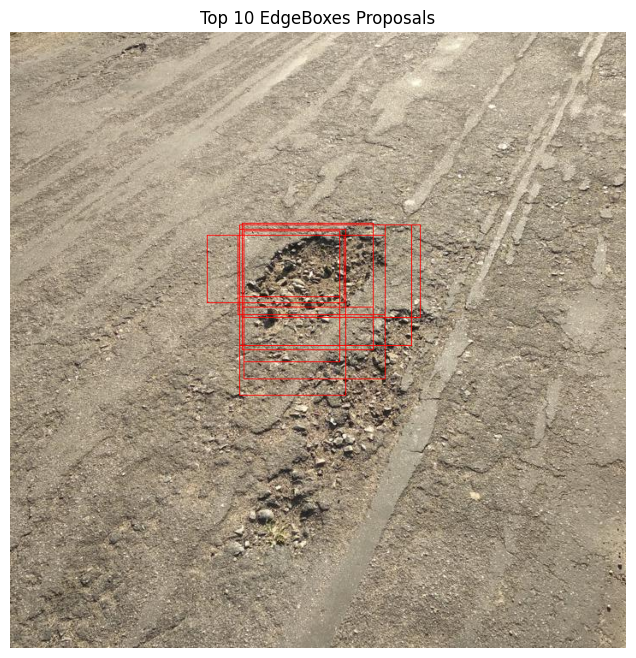

Visualized image saved at EdgeBox_example_image_top_proposals.jpg.


In [8]:

images_directory = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/annotated-images'  # Path to images
example_image_filename = 'img-6.jpg'  # Replace with your example image filename
example_image_path = os.path.join(images_directory, example_image_filename)
proposals_directory = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/edgeboxes_output'  # Directory where Selective Search proposals are saved
proposals_file = os.path.join(proposals_directory, os.path.splitext(example_image_filename)[0] + '_edgeboxes.npy')
output_visualization_path = 'EdgeBox_example_image_top_proposals.jpg'  # Path to save the visualization (optional)
top_n = 10  # Number of top proposals to visualize


# Load the proposals
proposals = np.load(proposals_file, allow_pickle=True)
print(f"Loaded {len(proposals)} proposals from {proposals_file}.")

# Visualize the top N proposals
visualize_top_proposals(
    image_path=example_image_path,
    proposals=proposals,
    top_n=top_n,
    save_path=output_visualization_path,
    alg="eb" # Set to None if you don't want to save the image
)

# Task 3 Model Evaluation

Two metrics produce valuable insights about the algorithms perofrmance in generating areas of interests.
- **Pascal-Recall:** The percentage of ground-truth objects that have at least one proposal overlapping with them at an IoU (Intersection over Union) greater than or equal to a threshold (typically 0.5). It measures how well the proposals cover the actual objects in the dataset.
- **MABO(Mean Average Best Overlap)::**  For each ground-truth object, find the proposal with the highest IoU. MABO is the average of these maximum IoUs over all ground-truth objects. It assesses the localization quality of the proposals.

Evaluating Selective Search Proposals...


Selective Search - Proposals: 1, Recall: 0.0115, MABO: 0.0302
Selective Search - Proposals: 2, Recall: 0.0287, MABO: 0.0574
Selective Search - Proposals: 4, Recall: 0.0580, MABO: 0.0955
Selective Search - Proposals: 8, Recall: 0.1126, MABO: 0.1646
Selective Search - Proposals: 19, Recall: 0.2144, MABO: 0.2708
Selective Search - Proposals: 50, Recall: 0.4282, MABO: 0.4287

Evaluating Edge Boxes Proposals...
Edge Boxes - Proposals: 1, Recall: 0.0672, MABO: 0.0769
Edge Boxes - Proposals: 2, Recall: 0.0960, MABO: 0.1051
Edge Boxes - Proposals: 4, Recall: 0.1282, MABO: 0.1425
Edge Boxes - Proposals: 8, Recall: 0.1701, MABO: 0.1818
Edge Boxes - Proposals: 19, Recall: 0.2247, MABO: 0.2364
Edge Boxes - Proposals: 50, Recall: 0.3092, MABO: 0.3099


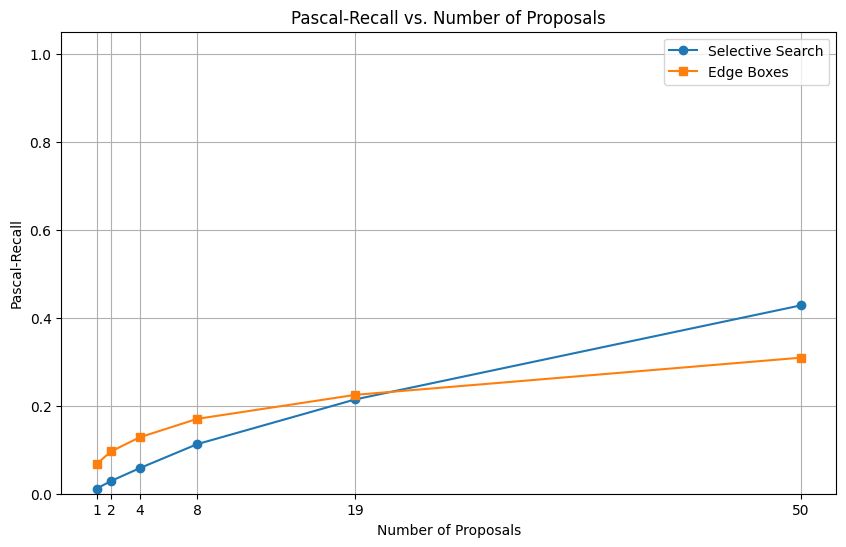

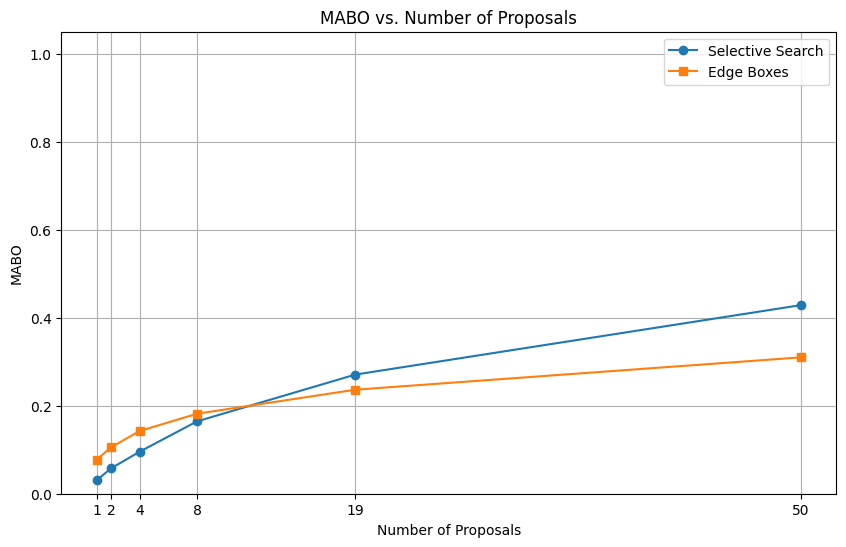

In [9]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import matplotlib.pyplot as plt

def parse_annotation(xml_file):
    """
    Parses a Pascal VOC XML file and extracts bounding box coordinates.

    Args:
        xml_file (str): Path to the XML annotation file.

    Returns:
        list: A list of dictionaries containing bounding box coordinates.
    """
    tree = ET.parse(xml_file)
    root = tree.getroot()
    boxes = []

    for obj in root.iter('object'):
        bbox = obj.find('bndbox')
        box = {
            'xmin': int(float(bbox.find('xmin').text)),
            'ymin': int(float(bbox.find('ymin').text)),
            'xmax': int(float(bbox.find('xmax').text)),
            'ymax': int(float(bbox.find('ymax').text)),
            'class': obj.find('name').text
        }
        boxes.append(box)

    return boxes

def compute_iou(boxA, boxB):
    """
    Computes Intersection over Union (IoU) between two bounding boxes.

    Args:
        boxA (dict): Ground-truth bounding box.
        boxB (tuple): Proposal bounding box (x, y, w, h).

    Returns:
        float: IoU value.
    """
    # Convert boxB from (x, y, w, h) to (xmin, ymin, xmax, ymax)
    boxB_converted = {
        'xmin': boxB[0],
        'ymin': boxB[1],
        'xmax': boxB[0] + boxB[2],
        'ymax': boxB[1] + boxB[3]
    }

    xA = max(boxA['xmin'], boxB_converted['xmin'])
    yA = max(boxA['ymin'], boxB_converted['ymin'])
    xB = min(boxA['xmax'], boxB_converted['xmax'])
    yB = min(boxA['ymax'], boxB_converted['ymax'])

    interWidth = max(0, xB - xA + 1)
    interHeight = max(0, yB - yA + 1)
    interArea = interWidth * interHeight

    boxAArea = (boxA['xmax'] - boxA['xmin'] + 1) * (boxA['ymax'] - boxA['ymin'] + 1)
    boxBArea = (boxB_converted['xmax'] - boxB_converted['xmin'] + 1) * (boxB_converted['ymax'] - boxB_converted['ymin'] + 1)

    denominator = boxAArea + boxBArea - interArea
    iou = interArea / denominator if denominator > 0 else 0

    return iou

def evaluate_proposals(annotations_dir, proposals_dir, method_name, num_proposals_list, proposal_suffix, iou_threshold=0.5):
    """
    Evaluates the proposals by computing Pascal-Recall and MABO at different numbers of proposals.

    Args:
        annotations_dir (str): Directory containing XML annotation files.
        proposals_dir (str): Directory containing proposals (.npy files).
        method_name (str): Name of the proposal method (for labeling purposes).
        num_proposals_list (list): List of proposal counts to evaluate.
        proposal_suffix (str): Suffix for proposal filenames (e.g., '_proposals.npy' or '_edgeboxes.npy').
        iou_threshold (float): IoU threshold for a positive match.

    Returns:
        dict: Contains 'recalls' and 'mabo' lists corresponding to num_proposals_list.
    """
    annotation_files = [f for f in os.listdir(annotations_dir) if f.endswith('.xml')]
    total_gt_boxes = 0

    num_proposals_list = sorted(num_proposals_list)
    results = {'recalls': [], 'mabo': []}

    for n in num_proposals_list:
        recall_numerator = 0
        mabo_total = 0.0
        total_gt_boxes = 0

        for idx, annotation_file in enumerate(annotation_files):
            xml_path = os.path.join(annotations_dir, annotation_file)
            gt_boxes = parse_annotation(xml_path)
            total_gt_boxes += len(gt_boxes)

            image_id = os.path.splitext(annotation_file)[0]
            proposals_file = os.path.join(proposals_dir, image_id + proposal_suffix)

            if not os.path.exists(proposals_file):
                print(f"{method_name}: Proposals for '{image_id}' not found. Skipping.")
                continue

            proposals = np.load(proposals_file, allow_pickle=True)
            if len(proposals) == 0:
                continue

            proposals_n = proposals[:n]
            matched_gt = 0

            for gt_box in gt_boxes:
                max_iou = 0.0
                for prop in proposals_n:
                    iou = compute_iou(gt_box, prop)
                    if iou > max_iou:
                        max_iou = iou
                mabo_total += max_iou
                if max_iou >= iou_threshold:
                    matched_gt += 1

            recall_numerator += matched_gt

        # Calculate recall and MABO for n proposals
        recall = recall_numerator / total_gt_boxes if total_gt_boxes > 0 else 0
        mabo = mabo_total / total_gt_boxes if total_gt_boxes > 0 else 0

        results['recalls'].append(recall)
        results['mabo'].append(mabo)

        print(f"{method_name} - Proposals: {n}, Recall: {recall:.4f}, MABO: {mabo:.4f}")

    return results

def plot_metric_vs_proposals(num_proposals_list, metric_ss, metric_eb, metric_name):
    """
    Plots a metric (Recall or MABO) vs. number of proposals for both methods.

    Args:
        num_proposals_list (list): List of proposal counts.
        metric_ss (list): Metric values for Selective Search.
        metric_eb (list): Metric values for Edge Boxes.
        metric_name (str): Name of the metric ('Pascal-Recall' or 'MABO').
    """
    plt.figure(figsize=(10, 6))
    plt.plot(num_proposals_list, metric_ss, marker='o', label='Selective Search')
    plt.plot(num_proposals_list, metric_eb, marker='s', label='Edge Boxes')
    plt.xlabel('Number of Proposals')
    plt.ylabel(metric_name)
    plt.title(f'{metric_name} vs. Number of Proposals')
    plt.legend()
    plt.grid(True)
    plt.xticks(num_proposals_list)
    plt.ylim(0, 1.05)
    plt.show()

def main():
    # Update these paths to match your directory structure
    annotations_directory = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/annotated-images'  # Path to annotations (XML files)
    ss_proposals_directory = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/ss_proposals'  # Path to Selective Search proposals
    eb_proposals_directory = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/edgeboxes_output'  # Path to Edge Boxes proposals

    # Define proposal suffixes for each method
    ss_proposal_suffix = '_proposals.npy'      # Selective Search proposal files
    eb_proposal_suffix = '_edgeboxes.npy'      # Edge Boxes proposal files

    # Define the number of proposals to evaluate
    num_proposals_list = [1, 2, 4, 8, 19, 50] # , 100, 200, 500, 1000
    iou_threshold = 0.5

    # Evaluate Selective Search
    print("Evaluating Selective Search Proposals...")
    results_ss = evaluate_proposals(
        annotations_dir=annotations_directory,
        proposals_dir=ss_proposals_directory,
        method_name='Selective Search',
        num_proposals_list=num_proposals_list,
        proposal_suffix=ss_proposal_suffix,
        iou_threshold=iou_threshold
    )

    # Evaluate Edge Boxes
    print("\nEvaluating Edge Boxes Proposals...")
    results_eb = evaluate_proposals(
        annotations_dir=annotations_directory,
        proposals_dir=eb_proposals_directory,
        method_name='Edge Boxes',
        num_proposals_list=num_proposals_list,
        proposal_suffix=eb_proposal_suffix,
        iou_threshold=iou_threshold
    )

    # Plot Pascal-Recall vs. Number of Proposals
    plot_metric_vs_proposals(
        num_proposals_list=num_proposals_list,
        metric_ss=results_ss['recalls'],
        metric_eb=results_eb['recalls'],
        metric_name='Pascal-Recall'
    )

    # Plot MABO vs. Number of Proposals
    plot_metric_vs_proposals(
        num_proposals_list=num_proposals_list,
        metric_ss=results_ss['mabo'],
        metric_eb=results_eb['mabo'],
        metric_name='MABO'
    )

if __name__ == "__main__":
    main()


In [10]:
def visualize_proposals_with_gt(image_path, proposals, gt_boxes, top_n=100, save_path=None):
    """
    Visualizes proposals alongside ground-truth boxes on an image.

    Args:
        image_path (str): Path to the image file.
        proposals (list): List of proposal bounding boxes (x, y, w, h).
        gt_boxes (list): List of ground-truth bounding boxes.
        top_n (int): Number of top proposals to visualize.
        save_path (str, optional): Path to save the visualized image. If None, the image is not saved.
    """
    import matplotlib.patches as patches
    from PIL import Image

    # Load image
    image = Image.open(image_path)
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(image)

    # Draw ground-truth boxes in blue
    for gt in gt_boxes:
        rect = patches.Rectangle(
            (gt['xmin'], gt['ymin']),
            gt['xmax'] - gt['xmin'],
            gt['ymax'] - gt['ymin'],
            linewidth=2, edgecolor='blue', facecolor='none', label='Ground Truth'
        )
        ax.add_patch(rect)

    # Draw top N proposals in red
    for prop in proposals[:top_n]:
        rect = patches.Rectangle(
            (prop[0], prop[1]),
            prop[2],
            prop[3],
            linewidth=1, edgecolor='red', facecolor='none', label='Proposal'
        )
        ax.add_patch(rect)

    # Avoid duplicate labels in legend
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys())

    plt.title('Ground Truth vs. Proposals')
    plt.axis('off')
    plt.show()

    # Save the visualized image if a save path is provided
    if save_path:
        fig.savefig(save_path, bbox_inches='tight')
        print(f"Visualization saved at {save_path}.")


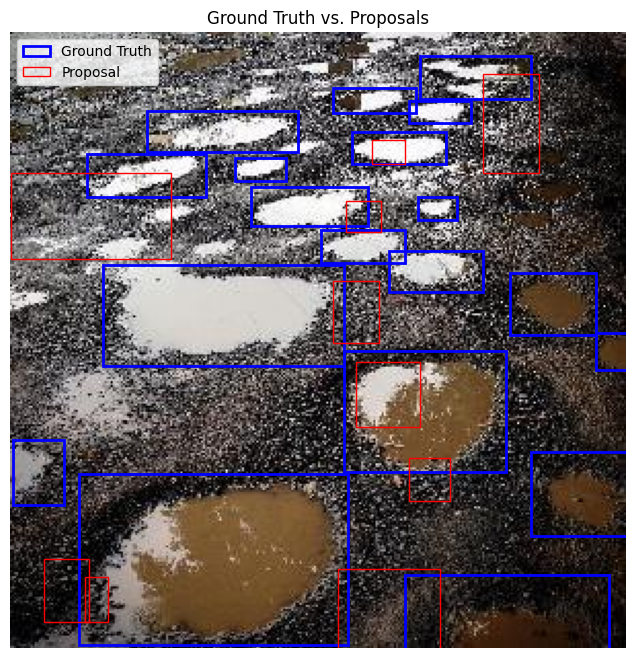

Visualization saved at ss_vs_gt.png.


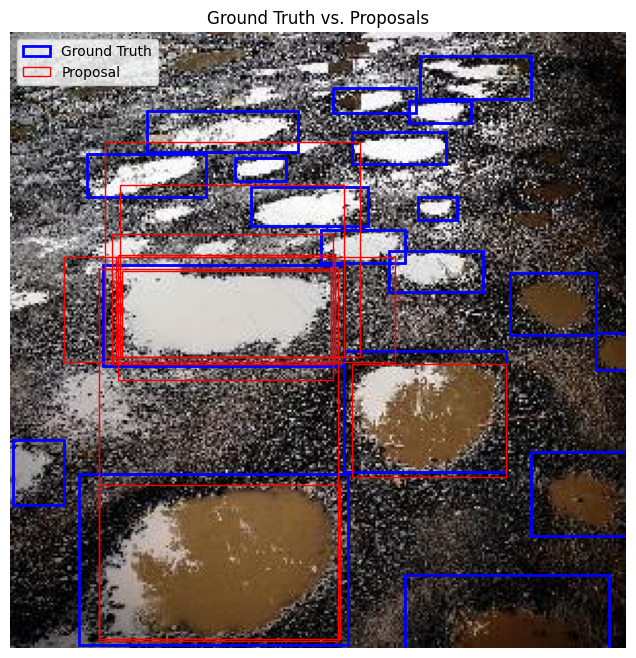

Visualization saved at eb_vs_gt.png.


In [11]:
# Example visualization for a single image
sample_image_id = 'img-595'  # Replace with an actual image ID
sample_image_path = os.path.join(annotations_directory, '../annotated-images', sample_image_id + '.jpg')
sample_annotation_file = os.path.join(annotations_directory, sample_image_id + '.xml')
sample_gt_boxes = parse_annotation(sample_annotation_file)

# Load proposals
ss_proposals_file = os.path.join("/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/ss_proposals/", sample_image_id + '_proposals.npy')
eb_proposals_file = os.path.join("/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/edgeboxes_output/", sample_image_id + '_edgeboxes.npy')

if os.path.exists(ss_proposals_file):
    ss_proposals = np.load(ss_proposals_file, allow_pickle=True)
else:
    ss_proposals = []

if os.path.exists(eb_proposals_file):
    eb_proposals = np.load(eb_proposals_file, allow_pickle=True)
else:
    eb_proposals = []

# Visualize Selective Search Proposals with Ground Truth
visualize_proposals_with_gt(
    image_path=sample_image_path,
    proposals=ss_proposals,
    gt_boxes=sample_gt_boxes,
    top_n=10,
    save_path='ss_vs_gt.png'  # Set to None if you don't want to save
)

# Visualize Edge Boxes Proposals with Ground Truth
visualize_proposals_with_gt(
    image_path=sample_image_path,
    proposals=eb_proposals,
    gt_boxes=sample_gt_boxes,
    top_n=10,
    save_path='eb_vs_gt.png'  # Set to None if you don't want to save
)


# Task4. Prepearation for training; Label Assignment:

Analyzes the IoU Threshold and marks as true the

A possible concern could have been that if let´s say three propsal with a high IoU with the ground trough higher than 0.5 are all labelled positive, we would have multiple propsals for each object. This could be a problem in a multiple class setup, where excesive positive proposals for the same object could result in class imbalance. Additionally a high number of overlapping proposals could introduce redundancy,making training less efficient.

On the other hand having multiple proposals covering covering the same object from different angles and positions can provide different training examples. It could serve as a sort of Data-Augmentation. It can also ensure that there is enough training samples for less frequent objects: such as for example a very small pothole.

We will define two methods:

1. **Limiting Positive Proposal per Ground-Truth object**


In [12]:
def assign_labels_to_proposals(annotations_dir, proposals_dir, output_dir, proposal_suffix,
                               pos_iou_threshold=0.5, neg_iou_threshold=0.1, max_pos_per_gt=5):
    """
    Assigns labels to proposals based on IoU with ground-truth boxes.
    
    Args:
        annotations_dir (str): Directory containing XML annotation files.
        proposals_dir (str): Directory containing proposal .npy files.
        output_dir (str): Directory to save labeled proposals.
        proposal_suffix (str): Suffix of proposal filenames (e.g., '_proposals.npy' or '_edgeboxes.npy').
        pos_iou_threshold (float): IoU threshold to assign positive labels.
        neg_iou_threshold (float): IoU threshold below which proposals are assigned as background.
        max_pos_per_gt (int): Maximum number of positive proposals per ground-truth object.
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    annotation_files = [f for f in os.listdir(annotations_dir) if f.endswith('.xml')]

    for annotation_file in annotation_files:
        xml_path = os.path.join(annotations_dir, annotation_file)
        image_id = os.path.splitext(annotation_file)[0]
        proposals_file = os.path.join(proposals_dir, image_id + proposal_suffix)

        if not os.path.exists(proposals_file):
            print(f"Proposals for '{image_id}' not found in '{proposals_dir}'. Skipping.")
            continue

        gt_boxes = parse_annotation(xml_path)
        proposals = np.load(proposals_file, allow_pickle=True)

        # Initialize counters for each ground-truth box
        gt_counters = {i: 0 for i in range(len(gt_boxes))}
        labeled_proposals = []
        for prop in proposals:
            max_iou = 0
            assigned_label = 'background'  # Default label
            assigned_gt = -1

            for idx, gt_box in enumerate(gt_boxes):
                iou = compute_iou(gt_box, prop)
                if iou > max_iou:
                    max_iou = iou
                    assigned_gt = idx

            if max_iou >= pos_iou_threshold and gt_counters[assigned_gt] < max_pos_per_gt:
                assigned_label = gt_boxes[assigned_gt]['class']
                gt_counters[assigned_gt] += 1
            elif max_iou < neg_iou_threshold:
                assigned_label = 'background'
            else:
                assigned_label = None  # To be ignored

            if assigned_label is not None:
                labeled_proposals.append({
                    'box': prop,
                    'label': assigned_label
                })

        if labeled_proposals:
            output_file = os.path.join(output_dir, image_id + '_labeled_proposals.npy')
            np.save(output_file, labeled_proposals)
            print(f"Labeled proposals saved for '{image_id}' in '{output_dir}'.")
        else:
            print(f"No labeled proposals for '{image_id}' after applying IoU thresholds.")


In [13]:

# Define directories
annotations_dir = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/annotated-images'  # Path to annotations (XML files)
ss_proposals_dir = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/ss_proposals'  # Selective Search proposals
eb_proposals_dir = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/edgeboxes_output'  # Edge Boxes proposals
output_dir_ss = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/Max_Prop/Labeled_Proposals_SS'  # Output for SS
output_dir_eb = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/Max_Prop/Labeled_Proposals_EB'  # Output for EB

# Define proposal suffixes
ss_proposal_suffix = '_proposals.npy'
eb_proposal_suffix = '_edgeboxes.npy'

# Assign labels for Selective Search Proposals
print("Assigning labels to Selective Search proposals...")
assign_labels_to_proposals(
    annotations_dir=annotations_dir,
    proposals_dir=ss_proposals_dir,
    output_dir=output_dir_ss,
    proposal_suffix=ss_proposal_suffix,
    pos_iou_threshold=0.7,
    neg_iou_threshold=0.1
)

# Assign labels for Edge Boxes Proposals
print("\nAssigning labels to Edge Boxes proposals...")
assign_labels_to_proposals(
    annotations_dir=annotations_dir,
    proposals_dir=eb_proposals_dir,
    output_dir=output_dir_eb,
    proposal_suffix=eb_proposal_suffix,
    pos_iou_threshold=0.7,
    neg_iou_threshold=0.1,
     max_pos_per_gt=5
)


Assigning labels to Selective Search proposals...
Labeled proposals saved for 'img-340' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/Max_Prop/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-351' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/Max_Prop/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-202' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/Max_Prop/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-300' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/Max_Prop/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-227' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/Max_Prop/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-532' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/Max_Prop/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-615' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/Max_Prop/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-620' in

Labeled proposals saved for 'img-438' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/Max_Prop/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-534' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/Max_Prop/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-71' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/Max_Prop/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-361' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/Max_Prop/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-75' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/Max_Prop/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-99' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/Max_Prop/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-483' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/Max_Prop/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-369' in '/home/arth/Desktop/various/CV/poster3/Potholes/Poth

In [14]:
def visualize_labeled_proposals(image_path, labeled_proposals, save_path=None):
    """
    Visualizes labeled proposals on the image.

    Args:
        image_path (str): Path to the image file.
        labeled_proposals (list): List of dictionaries with 'box' and 'label'.
        save_path (str, optional): Path to save the visualization image.
    """
    image = Image.open(image_path)
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(image)

    for proposal in labeled_proposals:
        box = proposal['box']
        label = proposal['label']
        x, y, w, h = box
        if label == 'background':
            edge_color = 'gray'
            linewidth = 1
        else:
            edge_color = 'red'
            linewidth = 2
        rect = patches.Rectangle((x, y), w, h, linewidth=linewidth, edgecolor=edge_color, facecolor='none')
        ax.add_patch(rect)
        ax.text(x, y, label, fontsize=8, color='yellow', bbox=dict(facecolor=edge_color, alpha=0.5))

    plt.title('Labeled Proposals')
    plt.axis('off')
    plt.show()

    if save_path:
        fig.savefig(save_path, bbox_inches='tight')
        print(f"Visualization saved at '{save_path}'.")

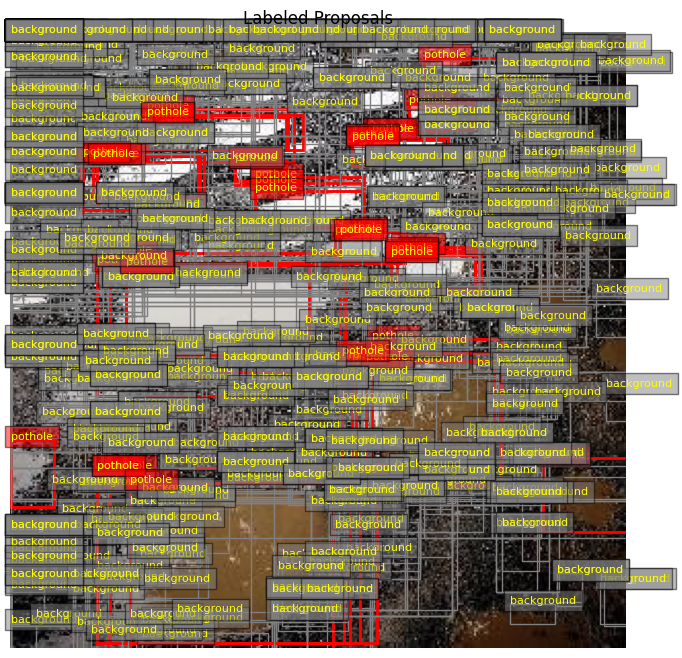

Visualization saved at 'labeled_proposals_ss_img-1.png'.


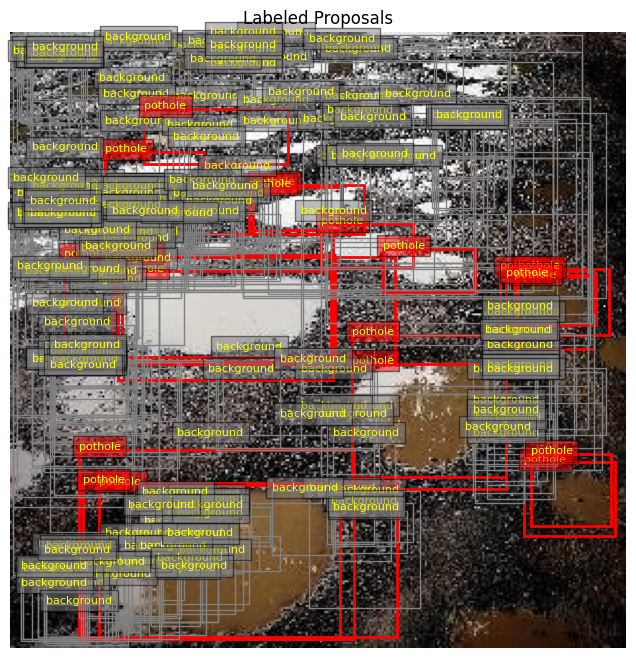

Visualization saved at 'labeled_proposals_eb_img-1.png'.


In [15]:
def main():
    # ... [Previous code]

    # Example visualization for a single image from Selective Search
    sample_image_id = 'img-595'  # Replace with an actual image ID
    image_path = os.path.join('/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/annotated-images', sample_image_id + '.jpg')
    labeled_proposals_file = os.path.join(output_dir_ss, sample_image_id + '_labeled_proposals.npy')

    if os.path.exists(labeled_proposals_file):
        labeled_proposals = np.load(labeled_proposals_file, allow_pickle=True)
        visualize_labeled_proposals(image_path, labeled_proposals, save_path='labeled_proposals_ss_img-1.png')
    else:
        print(f"Labeled proposals for '{sample_image_id}' not found.")

    # Similarly, visualize for Edge Boxes
    labeled_proposals_file_eb = os.path.join(output_dir_eb, sample_image_id + '_labeled_proposals.npy')

    if os.path.exists(labeled_proposals_file_eb):
        labeled_proposals_eb = np.load(labeled_proposals_file_eb, allow_pickle=True)
        visualize_labeled_proposals(image_path, labeled_proposals_eb, save_path='labeled_proposals_eb_img-1.png')
    else:
        print(f"Labeled proposals for '{sample_image_id}' not found.")

if __name__ == "__main__":
    main()


2. **Applying Non-Maximum Supression(NMS):**

In [16]:


def apply_nms(proposals, nms_threshold=0.3):
    """
    Applies Non-Maximum Suppression to proposals to reduce redundancy.

    Args:
        proposals (list): List of bounding boxes (x, y, w, h).
        nms_threshold (float): IoU threshold for suppression.

    Returns:
        list: Filtered proposals after NMS.
    """
    # Convert proposals to the format (x, y, w, h)
    boxes = []
    for prop in proposals:
        if len(prop) != 4:
            print(f"Invalid proposal format: {prop}. Expected (x, y, w, h). Skipping.")
            continue
        x, y, w, h = prop
        boxes.append([x, y, w, h])

    if not boxes:
        return []

    # Create a dummy scores list since NMSBoxes requires scores
    scores = [1.0] * len(boxes)

    # Apply NMS
    indices = cv2.dnn.NMSBoxes(boxes, scores, score_threshold=0.0, nms_threshold=nms_threshold)

    filtered_proposals = []
    if len(indices) > 0:
        # Handle different formats of 'indices'
        for idx in indices:
            if isinstance(idx, (list, tuple, np.ndarray)):
                index = idx[0]
            else:
                index = idx
            if index < len(proposals):
                filtered_proposals.append(proposals[index])
            else:
                print(f"Index {index} out of bounds for proposals list with length {len(proposals)}.")

    return filtered_proposals

def assign_labels_to_proposals(annotations_dir, proposals_dir, output_dir, proposal_suffix,
                               pos_iou_threshold=0.5, neg_iou_threshold=0.1, max_pos_per_gt=5, nms_threshold=0.3):
    """
    Assigns labels to proposals based on IoU with ground-truth boxes.
    
    Args:
        annotations_dir (str): Directory containing XML annotation files.
        proposals_dir (str): Directory containing proposal .npy files.
        output_dir (str): Directory to save labeled proposals.
        proposal_suffix (str): Suffix of proposal filenames (e.g., '_proposals.npy' or '_edgeboxes.npy').
        pos_iou_threshold (float): IoU threshold to assign positive labels.
        neg_iou_threshold (float): IoU threshold below which proposals are assigned as background.
        max_pos_per_gt (int): Maximum number of positive proposals per ground-truth object.
        nms_threshold (float): IoU threshold for Non-Maximum Suppression.
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    annotation_files = [f for f in os.listdir(annotations_dir) if f.endswith('.xml')]

    for annotation_file in annotation_files:
        xml_path = os.path.join(annotations_dir, annotation_file)
        image_id = os.path.splitext(annotation_file)[0]
        proposals_file = os.path.join(proposals_dir, image_id + proposal_suffix)

        if not os.path.exists(proposals_file):
            print(f"Proposals for '{image_id}' not found in '{proposals_dir}'. Skipping.")
            continue

        gt_boxes = parse_annotation(xml_path)
        proposals = np.load(proposals_file, allow_pickle=True)

        # Apply NMS to proposals
        proposals = apply_nms(proposals, nms_threshold=nms_threshold)

        # Initialize counters for each ground-truth box
        gt_counters = {i: 0 for i in range(len(gt_boxes))}
        labeled_proposals = []
        for prop in proposals:
            max_iou = 0
            assigned_label = 'background'  # Default label
            assigned_gt = -1

            for idx, gt_box in enumerate(gt_boxes):
                iou = compute_iou(gt_box, prop)
                if iou > max_iou:
                    max_iou = iou
                    assigned_gt = idx

            if max_iou >= pos_iou_threshold and gt_counters[assigned_gt] < max_pos_per_gt:
                assigned_label = gt_boxes[assigned_gt]['class']
                gt_counters[assigned_gt] += 1
            elif max_iou < neg_iou_threshold:
                assigned_label = 'background'
            else:
                assigned_label = None  # To be ignored

            if assigned_label is not None:
                labeled_proposals.append({
                    'box': prop,
                    'label': assigned_label
                })

        if labeled_proposals:
            output_file = os.path.join(output_dir, image_id + '_labeled_proposals.npy')
            np.save(output_file, labeled_proposals)
            print(f"Labeled proposals saved for '{image_id}' in '{output_dir}'.")
        else:
            print(f"No labeled proposals for '{image_id}' after applying IoU thresholds.")


In [17]:

# Define directories
annotations_dir = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/annotated-images'  # Path to annotations (XML files)
ss_proposals_dir = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/ss_proposals'  # Selective Search proposals
eb_proposals_dir = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/edgeboxes_output'  # Edge Boxes proposals
output_dir_ss = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/NMS/Labeled_Proposals_SS'  # Output for SS
output_dir_eb = '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/NMS/Labeled_Proposals_EB'  # Output for EB

# Define proposal suffixes
ss_proposal_suffix = '_proposals.npy'
eb_proposal_suffix = '_edgeboxes.npy'

# Assign labels for Selective Search Proposals
print("Assigning labels to Selective Search proposals...")
assign_labels_to_proposals(
    annotations_dir=annotations_dir,
    proposals_dir=ss_proposals_dir,
    output_dir=output_dir_ss,
    proposal_suffix=ss_proposal_suffix,
    pos_iou_threshold=0.5,
    neg_iou_threshold=0.1
)

# Assign labels for Edge Boxes Proposals
print("\nAssigning labels to Edge Boxes proposals...")
assign_labels_to_proposals(
    annotations_dir=annotations_dir,
    proposals_dir=eb_proposals_dir,
    output_dir=output_dir_eb,
    proposal_suffix=eb_proposal_suffix,
    pos_iou_threshold=0.5,
    neg_iou_threshold=0.1,
     max_pos_per_gt=5
)


Assigning labels to Selective Search proposals...
Labeled proposals saved for 'img-340' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/NMS/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-351' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/NMS/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-202' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/NMS/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-300' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/NMS/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-227' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/NMS/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-532' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/NMS/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-615' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/NMS/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-620' in '/home/arth/Desktop/various/CV/pos

Labeled proposals saved for 'img-230' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/NMS/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-496' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/NMS/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-609' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/NMS/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-24' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/NMS/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-424' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/NMS/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-58' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/NMS/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-289' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/NMS/Labeled_Proposals_SS'.
Labeled proposals saved for 'img-321' in '/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/NMS/Labeled_Proposals_SS'.
La

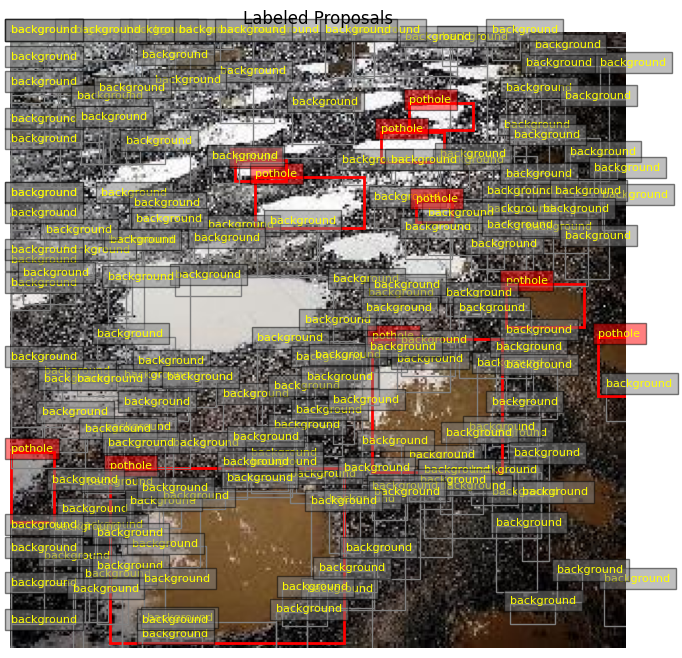

Visualization saved at 'labeled_proposals_ss_img-1.png'.


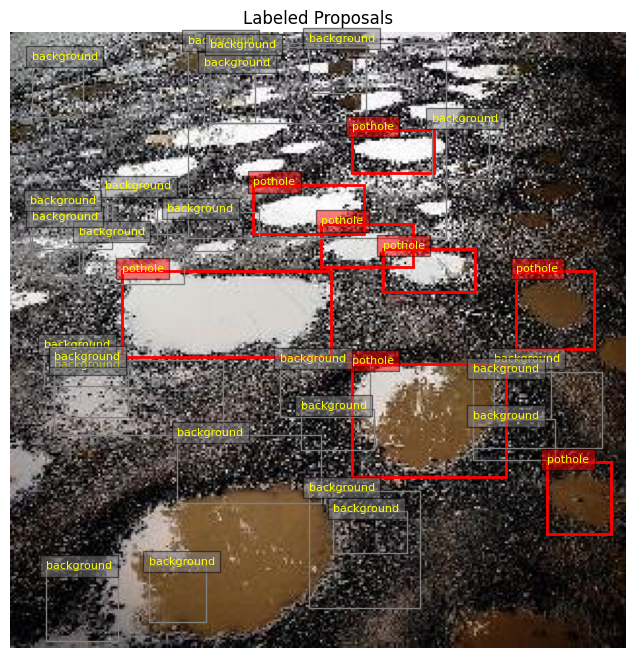

Visualization saved at 'labeled_proposals_eb_img-1.png'.


In [18]:
def main():
    # ... [Previous code]

    # Example visualization for a single image from Selective Search
    sample_image_id = 'img-595'  # Replace with an actual image ID
    image_path = os.path.join('/home/arth/Desktop/various/CV/poster3/Potholes/Potholes/annotated-images', sample_image_id + '.jpg')
    labeled_proposals_file = os.path.join(output_dir_ss, sample_image_id + '_labeled_proposals.npy')

    if os.path.exists(labeled_proposals_file):
        labeled_proposals = np.load(labeled_proposals_file, allow_pickle=True)
        visualize_labeled_proposals(image_path, labeled_proposals, save_path='labeled_proposals_ss_img-1.png')
    else:
        print(f"Labeled proposals for '{sample_image_id}' not found.")

    # Similarly, visualize for Edge Boxes
    labeled_proposals_file_eb = os.path.join(output_dir_eb, sample_image_id + '_labeled_proposals.npy')

    if os.path.exists(labeled_proposals_file_eb):
        labeled_proposals_eb = np.load(labeled_proposals_file_eb, allow_pickle=True)
        visualize_labeled_proposals(image_path, labeled_proposals_eb, save_path='labeled_proposals_eb_img-1.png')
    else:
        print(f"Labeled proposals for '{sample_image_id}' not found.")

if __name__ == "__main__":
    main()


Bare in mind that limiting the number of positive porposals per ground-truth object to 1 and applying NMS is different:

# key differences between the two approaches

| aspect                | limiting proposals per object to 1              | applying non-maximum suppression (nms)                 |
|-----------------------|-------------------------------------------------|--------------------------------------------------------|
| goal                  | selects a single best proposal per object       | eliminates redundant overlapping proposals             |
| diversity             | limited (only one proposal per object)          | higher (multiple perspectives of the same object)      |
| approach              | object-based constraint                         | overlap-based constraint                               |
| typical use case      | small datasets or when overfitting is a concern | large datasets, handling occlusions, and varied scales |
| impact on training    | simplifies training, reduces computation        | increases robustness, more computation                 |
